# Feature Extraction using SIFT

## 💡 1. Introduction 

### 1.1 The objective
There is an old saying that you shouldn't judge a book by its cover, but with modern technology this might actually be possible. For such a recommendation system to work, we need to find a way to recognize the video-game box art. In this document we are going to look at how well SIFT performs at solving this problem.

### 1.2 About the document
This document serves as a consistent environment to see and experiment how the different parameters can have an influence on the performance of SIFT. In this document, I will write down all the thoughts, ideas, hypotheses and discoveries I've made along the way.

## ⚙️ 2. Settings

In [1]:
## SETTINGS FOR QUERY_IMAGES
QUERY_IMAGES_PATH = '../../data/box-art/samples/query-images'

## SETTINGS FOR TARGET_IMAGES
TARGET_IMAGES_PATH = '../../data/box-art/samples/target-images'

## NUMBER OF KEYPOINTS (FEATURES)
## TO EXTRACT FROM AN IMAGE
N_KEYPOINTS = 500

## THE SIZE OF THE IMAGES WHILE 
## EXTRACTING THE FEATURES
IMAGE_THUMBNAIL_SIZE = 256

## THE DISTANCE RATIO BETWEEN THE TWO
## NEAREST MATCHES OF KEYPOINTS
MATCH_DESCRIPTOR_RATIO = 0.75

## THE MINIMUM NUMBER OF MATCHES
## TO BE CONSIDERED THE SAME IMAGE
MATCH_DESCRIPTOR_THRESHOLD = 30

## 📚 3. Preparations

### 3.1 Importing libraries
For extracting the SIFT keypoints and descriptors I'm going to use the OpenCV library. OpenCV is an open-source computer vision and machine learning software library that provides a common infrastructure for computer vision applications. More info about OpenCV can be found at https://opencv.org/about/

I've also included a [helper](https://github.com/i442124/SuperScope/blob/main/notebooks/feature-extraction/helper.py) module with some common functionality that we will see across all notebooks regarding image (pre)processing. This allows us to focus solely onto the topic of SIFT feature extraction. I'd recommend that you'd read this module at your own leisure after finishing this notebook.

In [2]:
import cv2
import math
import helper
import matplotlib
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import seaborn as sns

### 3.2 Importing datasets
The datasets consist of two separate types of images called query images and target images. The query images are images captured with my mobile phone of the box-art of a video game. The target images are high quality rips of the box art images that can be found on the query images. The location of these images are provided by the `QUERY_IMAGES_PATH` and the `TARGET_IMAGES_PATH` variables.

In [3]:
QUERY_IMAGES = helper.load_images_in_dir(QUERY_IMAGES_PATH)
QUERY_IMAGES.head(5)

,label,image
0,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,..."
1,donkey.jpg,"[[[189, 184, 162], [189, 184, 162], [190, 185,..."
2,hyrule.jpg,"[[[175, 179, 164], [174, 178, 163], [172, 174,..."
3,mario.jpg,"[[[166, 163, 148], [167, 164, 149], [170, 167,..."
4,smash.jpg,"[[[147, 144, 125], [147, 144, 125], [150, 144,..."


In [4]:
TARGET_IMAGES = helper.load_images_in_dir(TARGET_IMAGES_PATH)
TARGET_IMAGES.head(5)

,label,image
0,animal.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
1,donkey.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
2,hyrule.jpg,"[[[207, 204, 197], [208, 205, 198], [210, 207,..."
3,mario.jpg,"[[[251, 251, 251], [254, 254, 254], [255, 255,..."
4,smash.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


## 🎨 4. Spectating the images

### 4.1 Query Images
Let’s start off with looking at the query images I took. These images are supposed to represent a picture someone would take what they intend to scan a video game of interest. I purposefully added a little background noise and some glares from the light source onto the box-art to distort the image enough so we can be sure that the approach is flexible enough to be used the environment we are aiming for.

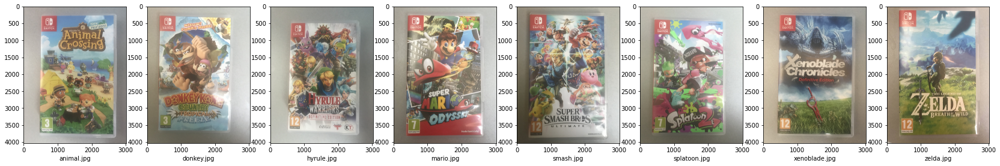

In [5]:
helper.spectate_image_set(QUERY_IMAGES)

### 4.2 Target Images
Next, we have the target images. These are the original box art images as they are provided with the game. They are supposed to be vibrant and clear with no noise nor distortions in lightning. They are the ideal 'target' of how a picture should look when captured with the camera. In optimal conditions, the query images should match these images exactly in terms of color and brightness.

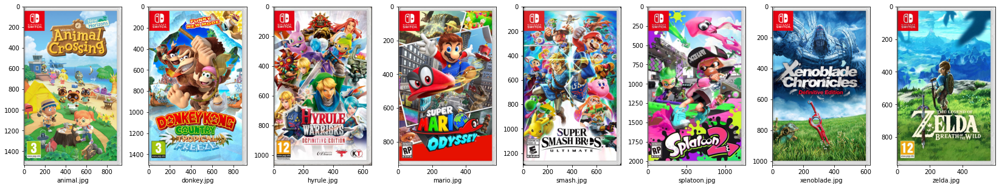

In [6]:
helper.spectate_image_set(TARGET_IMAGES)

## 🔎 5. Feature Extraction

### 5.1 Creating the detector
Scale-invariant feature transform or, SIFT for short, is a feature detection algorithm to detect and describe local features in images. SIFT looks for a set of keypoints in the image with each keypoint having a corresponding descriptor that contains a lot of valuable information about that keypoint.

We can use `cv2.SIFT_create()` to create a SIFT detector with the number of desired keypoints. Using the `sift.dectectAndCompute()` method we can start looking for keypoints of interests on the image.

In [7]:
def extract_from_image(image):
    sift = cv2.SIFT_create(N_KEYPOINTS)
    return sift.detectAndCompute(image, mask=None)

### 5.2 Detecting features
With the detector in place we can start looking for keypoints in the images from our dataset. However some of these images are quite large which would mean it would take a while from them to be found. Let's create thumbnail variations of all the images we have so they can be used for feature extraction.

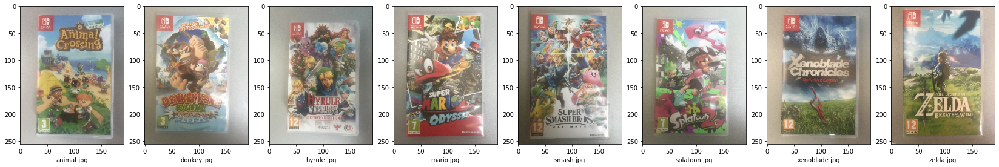

In [8]:
QUERY_IMAGES['thumbnail'] = QUERY_IMAGES['image'].apply(helper.resize_image, height=IMAGE_THUMBNAIL_SIZE)
helper.spectate_image_set(QUERY_IMAGES, column='thumbnail')

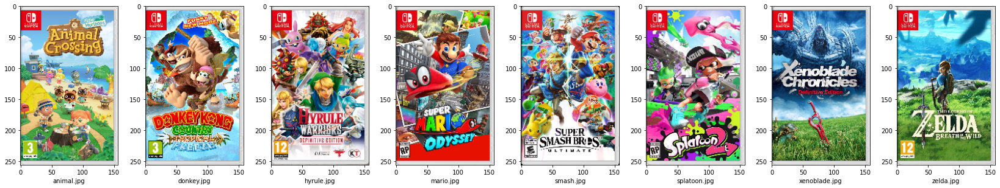

In [9]:
TARGET_IMAGES['thumbnail'] = TARGET_IMAGES['image'].apply(helper.resize_image, height=IMAGE_THUMBNAIL_SIZE)
helper.spectate_image_set(TARGET_IMAGES, column='thumbnail')

Now we can extract the keypoints and descriptors from both the query and target images.

In [10]:
def draw_points_of_intrests(row):
    RGB2GRAY = cv2.COLOR_RGB2GRAY
    keypoints, thumbnail = row['keypoints'], row['thumbnail']
    return cv2.drawKeypoints(cv2.cvtColor(thumbnail, RGB2GRAY), keypoints, np.array([]))

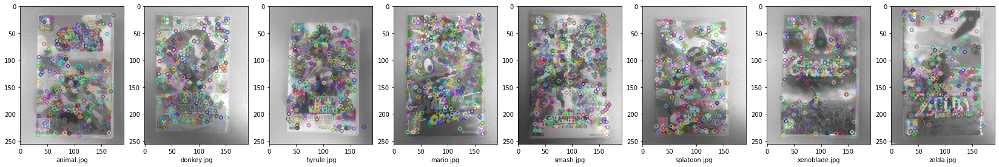

In [11]:
QUERY_IMAGES[['keypoints', 'descriptors']] = QUERY_IMAGES['thumbnail'].apply(extract_from_image).apply(pd.Series)
QUERY_IMAGES['points_of_intrests'] = QUERY_IMAGES.apply(draw_points_of_intrests, axis=1)
helper.spectate_image_set(QUERY_IMAGES, column='points_of_intrests')

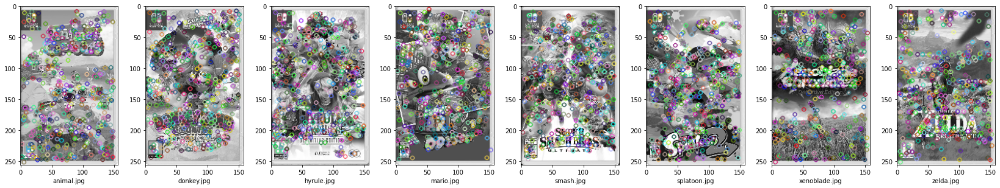

In [12]:
TARGET_IMAGES[['keypoints', 'descriptors']] = TARGET_IMAGES['thumbnail'].apply(extract_from_image).apply(pd.Series)
TARGET_IMAGES['points_of_intrests'] = TARGET_IMAGES.apply(draw_points_of_intrests, axis=1)
helper.spectate_image_set(TARGET_IMAGES, column='points_of_intrests')

## 🧑‍🤝‍🧑 6. Match Descriptors

### 6.1 Creating the descriptor matcher
There are several techniques we can use for matching descriptors with each other. I'll start off with using the good old brute force matcher. It guarantees the best possible results but is not optimal when it comes down to performance. There are alternatives available like [FLANN](https://docs.opencv.org/3.4/d5/d6f/tutorial_feature_flann_matcher.html), which aim to circumvent this issue but we aim for the best possible accuracy at the moment.

In [13]:
matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE)

### 6.2 Matching the descriptors
Now that we have configured our basic matcher, we can start matching the descriptors from the query images with the target images. We can use regular kNN for finding the closest descriptors. We use [Lowe's](https://stackoverflow.com/a/60343973) ratio to filter our false positive matches.

In [14]:
def match_descriptors(query_desc, target_desc):
    matches = matcher.knnMatch(query_desc, target_desc, 2)
    return [[m] for m, n in matches if m.distance < MATCH_DESCRIPTOR_RATIO * n.distance]

Let's start predicting some stuff. We are going to loop through every possible combination of images and try to match the descriptors with each other. I'd expect there to be a huge difference in the number of matches between the correct combinations compared to images that don't match at all!

In [15]:
predictions = []
for y, row in QUERY_IMAGES.iterrows():
    
    matches = []
    for x, column in TARGET_IMAGES.iterrows():
        desc_matches = match_descriptors(row['descriptors'], column['descriptors'])
        matches.append((column['thumbnail'], column['keypoints'], desc_matches))
        
    matches.sort(key=lambda x: len(x[2]), reverse=True)
    predictions.append((row['thumbnail'], row['keypoints'], matches))

## 📈 7. Visualisations

### 7.1 Sorting images by match count
Now that we have the predictions ready, let's see how it went. When the number of matches is larger than `MATCH_DESCRIPTOR_THRESHOLD` the target image MUST match the query image. These images will be highlighted in blue.

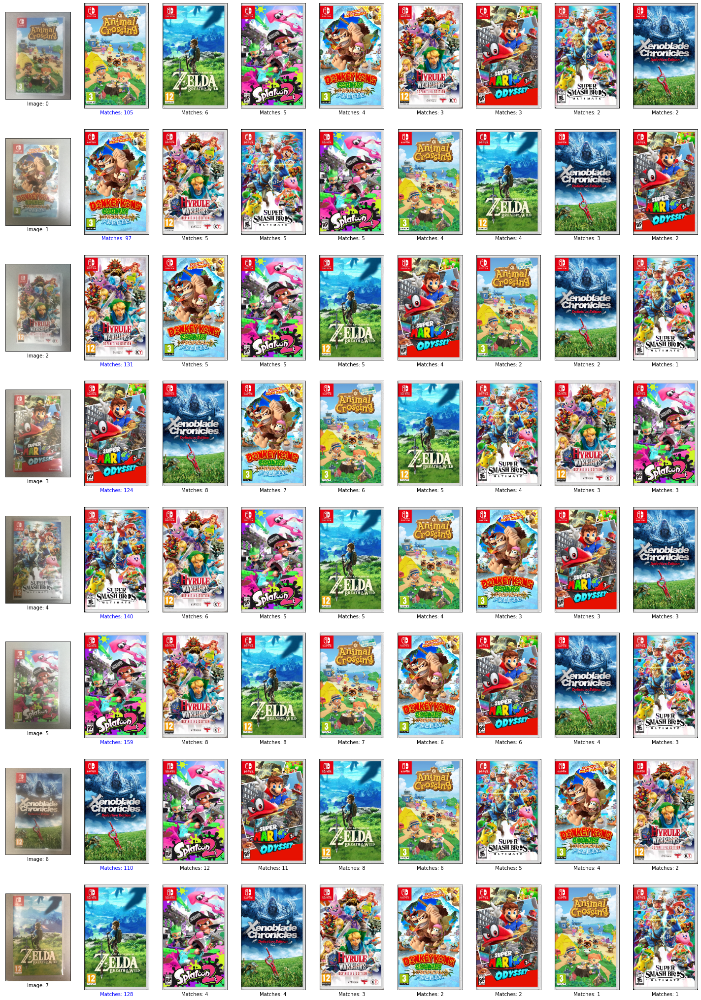

In [16]:
nrows = len(QUERY_IMAGES)
ncols = len(TARGET_IMAGES) + 1

plt.figure(figsize=(2.8*ncols, 4.6*nrows))
for y, (q_img, q_keypoints, matches) in enumerate(predictions):
    plt.subplot(nrows, ncols, y * ncols + 1)
    plt.xlabel(f'Image: {y}')
    plt.imshow(q_img)
    plt.xticks([])
    plt.yticks([])
    
    for x, (t_data, t_keypoints, desc_matches) in enumerate(matches):
        plt.subplot(nrows, ncols, y * ncols + 1 + x + 1)
        plt.xlabel(f'Matches: {len(desc_matches)}', color='b' if len(desc_matches) >= MATCH_DESCRIPTOR_THRESHOLD else 'k')
        plt.imshow(t_data)
        plt.xticks([])
        plt.yticks([])

plt.show()

Perfect! There is a clear distinction between the correct images (around 100 matches) and the second best matches (12 being the most).

### 7.2 Visualizing the matches
Although the results are working we can't clearly see why they are working. OpenCV has a nice function called `cv2.drawMatchesKnn` that allows use to better visualize what is going on. Let's spectate all the best matches and see how it's doing.

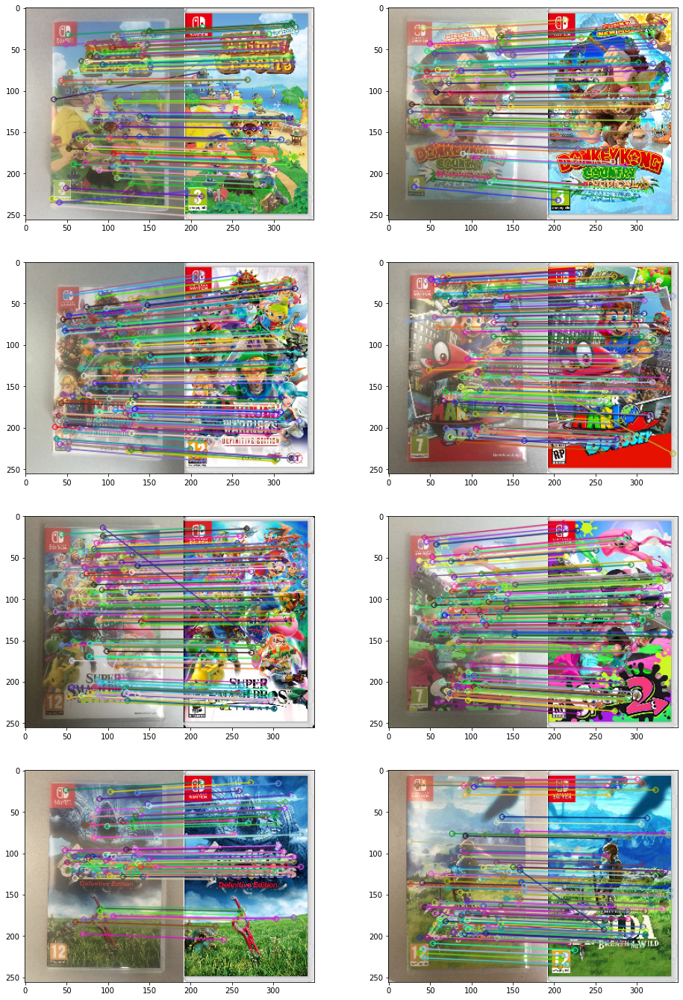

In [17]:
ncols = 2
nrows = math.ceil(len(QUERY_IMAGES) / ncols)

fig = plt.figure(figsize=(16,24))
axs = [fig.add_subplot(nrows, ncols, r * ncols + c + 1) 
       for r in range(0, nrows) for c in range(0, ncols)]

for idx, (q_data, q_keypoints, cross_match) in enumerate(predictions):
    
    # Matches are sorted by their length,
    # So the first entry has the most matches
    t_data, t_keypoints, matches = cross_match[0]

    # Plot the matches between the query images and best matching target image
    draw_params = dict(flags=2, singlePointColor = (0,0,0))
    axs[idx].imshow(cv2.drawMatchesKnn(q_data, q_keypoints, t_data, t_keypoints, matches, None, **draw_params))

## 🧪 8. Testing on the large dataset
Up until now we've only had to look between 8 distinct images, but how well does this perform when we increase the total number of images to 100, 1000, 5000? That's what I'd like to found out. It's important that the game we are scanning comes at the top spot, no exceptions! We don't want false positives to come out on top.

In [18]:
%store -r images
print(f'Number of images in the dataset: {len(images)}')

Number of images in the dataset: 6362


Due to the amount of games in the data storage solution I've only gathered the box-art images of the top 1000 games for the time being. This means we'll have to limit the selection of games that we can test to only the most popular entries that exists in this dataset.

In [19]:
TEST_IMAGES = (
    ('Animal Crossing', 'Animal Crossing: New Horizons', 
     QUERY_IMAGES.iloc[0][['thumbnail', 'keypoints', 'descriptors']]),
    ('Super Mario', 'Super Mario Odyssey', 
     QUERY_IMAGES.iloc[3][['thumbnail', 'keypoints', 'descriptors']]),
    ('Super Smash', 'Super Smash Bros. Ultimate',
     QUERY_IMAGES.iloc[4][['thumbnail', 'keypoints', 'descriptors']]),
    ('Xenoblade', 'Xenoblade Chronicles: Definitive Edition', 
     QUERY_IMAGES.iloc[6][['thumbnail', 'keypoints', 'descriptors']]),
    ('Zelda', 'The Legend of Zelda: Breath of the Wild', 
     QUERY_IMAGES.iloc[7][['thumbnail', 'keypoints', 'descriptors']]),
)

With the test images in place, we can start matching the descriptors with all the images in the dataset. I'm also very interested in the computation times in such a large collection. If it takes too long to complete the scan in only the subset, than we are bound to run into issues as the dataset will grow in the future.

In [37]:
def get_descriptor_matches(image):
    desc_matches = images['descriptors'].apply(lambda x: match_descriptors(image['descriptors'], x))
    matches = pd.DataFrame(images[['title', 'platform', 'image']])
    matches['count'] = desc_matches.apply(lambda x: len(x))    
    matches['matches'] = desc_matches
    return matches

In [39]:
predictions = []
for (name, title, image) in TEST_IMAGES:
    
    %time matches = get_descriptor_matches(image)
    matches = matches.sort_values(by='count', ascending=False)
    predictions.append((image['thumbnail'], image['keypoints'], matches))

Wall time: 5.05 s
Wall time: 5.68 s
Wall time: 5.78 s
Wall time: 3.65 s
Wall time: 4.08 s


The computation times are a little worrisome. Taking five seconds for a scan on only a subset of the full image collection is not really desirable. Not to mention if the scan fails, the user wait once again for the process to finish... This is something we will have to address in the future.

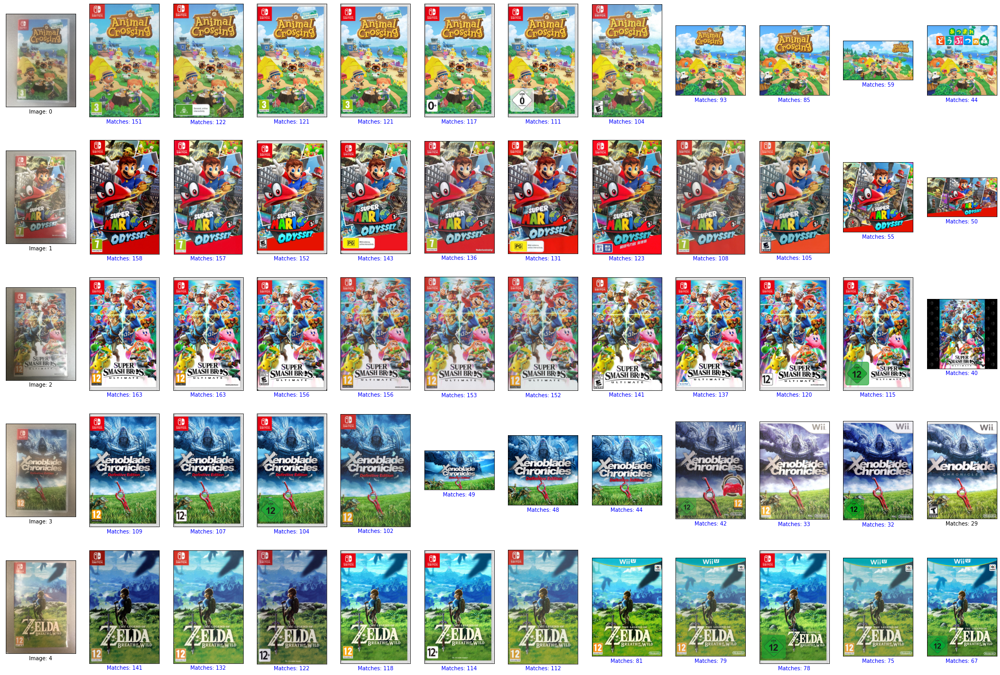

In [40]:
nrows = len(predictions)
ncols = 12

plt.figure(figsize=(2.8*ncols, 4.6*nrows))
for y, (q_data, q_keypoints, matches) in enumerate(predictions):
    plt.subplot(nrows, ncols, y * ncols + 1)
    plt.imshow(q_data)
    plt.xlabel(f'Image: {y}')
    plt.xticks([])
    plt.yticks([])
    
    for x, (_, row) in enumerate(matches.iloc[:ncols - 1].iterrows()):
        plt.subplot(nrows, ncols, y * ncols + 1 + x + 1)
        plt.xlabel(f'Matches: {len(row["matches"])}', color='b' if len(row['matches']) >= MATCH_DESCRIPTOR_THRESHOLD else 'k')
        plt.imshow(helper.load_image_from_string(row['image']))
        plt.xticks([])
        plt.yticks([])

plt.show()

Looks like all the games made it through. As you can tell, games often have multiple images in the dataset that with slight variations between them (like the game's age rating sticker or platform logo). All of them could be considered valid matches. Luckily we don't see any other games somewhere in the top 10 which is a good sign in regards to accuracy.

## 📝 9. Conclusion
We've experimented with SIFT to extract imporant features from both the query and target images with the goal in mind of recognizing the video game box art that is being scanned by the user.

* In the small sample set of 8 query images to 8 target images, the performance was super great! All the correct matches had over 100 keypoints that matched while the second to best match had only 12 keypoints (at most) that matched, which indicates that there is a clear distinction between good and bad matches, which is exactly what we want.
* When using a larger sample set of 6000 images, the performance was still incredible in regards to accuraccy, with all of the 5 scanned images being predicted correctly, however it took a few seconds to complete.

One aspect that does need to be addressed is performance. Scanning a single image in a set of roughly 6000 images takes a good couple of seconds. As the dataset will eventually grow, this could become very borthersome for users if it takes too long to complete a scan. [I have several ideas](https://github.com/i442124/SuperScope/tree/main/notebooks/feature-extraction) on techniques we can use to improve the performance while still retaining the accuraccy that SIFT provides. 